# SPACEc: Patch proximity analysis

Patch proximity analysis (PPA) analyses neighborhoods as patches of closely connected cells. The goal of the analysis is to analyze was surrounds these patches within a user defined radius. In our example we will use PPA to identify germinal centers as CN patches and then analyze what surrounds them based on the tissue condition (tonsil vs. tonsillitis). 

In [1]:
# import spacec
import spacec as sp

#import standard packages
import os
import scanpy as sc

# silencing warnings
import warnings
warnings.filterwarnings('ignore')

sc.settings.set_figure_params(dpi=80, facecolor='white')

In [ ]:
# Specify the path to the data
root_path = "/home/user/path/SPACEc/" # inset your own path

data_path = root_path + 'example_data/raw/' # where the data is stored

# where you want to store the output
output_dir = root_path + 'example_data/output/'
os.makedirs(output_dir, exist_ok=True)

Load the anndata object that contains the previously generated CN annotations. 

In [ ]:
# read in the annotated anndata
adata = sc.read(output_dir + 'adata_nn_demo_annotated_cn.h5ad')
adata

Setting the plotting parameter to True illustrates what the PPA function is detecting. This might be helpful if the min cluster size is unknown or the user wants to perform quality control. The results are stored as df in the adata.uns slot.

### Compute for proximal cells

Patch proximity analysis can be executed using two methods that detect patches by applying a concave hull to a selected neighborhood. The first method, 'border_cell_radius', identifies the cells outlining the hull along with their nearest neighbors. It then draws a circle with a specified radius around these cells to detect those in spatial proximity, while ignoring cells that belong to the same patch. This approach results in a highly precise border but can be more computationally intensive than the 'hull_expansion' method. Additionally, the 'border_cell_radius' method is sensitive to internal borders, effectively identifying holes within a patch if the radius extends over them.

Processing reg002_Germinal Center
Estimated number of clusters: 4
Estimated number of noise points: 7


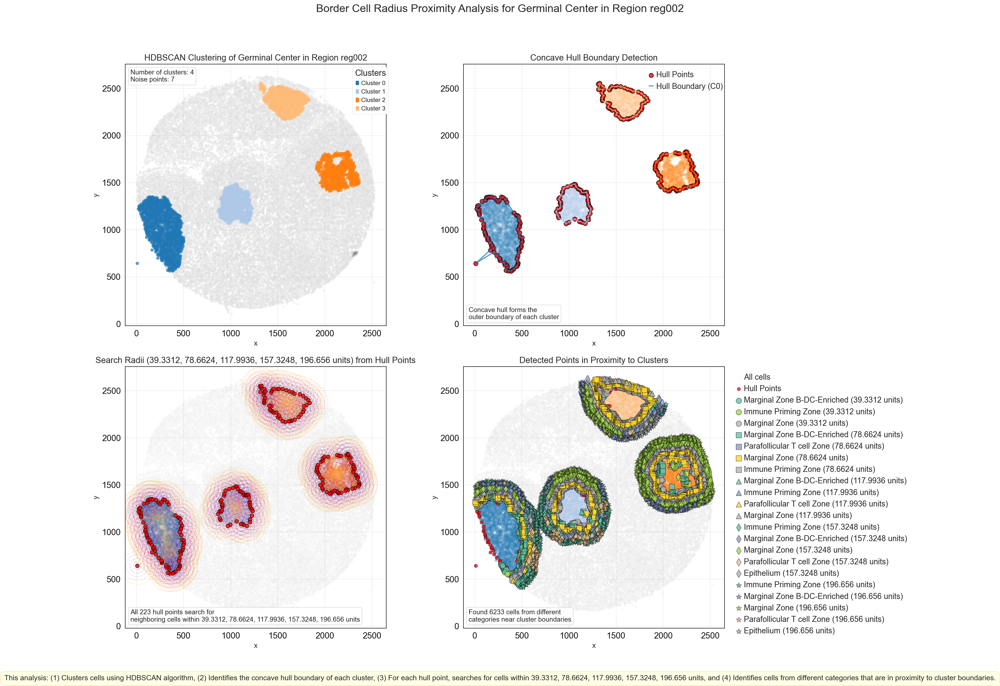

Finished reg002_Germinal Center
Processing reg001_Germinal Center
Estimated number of clusters: 2
Estimated number of noise points: 1


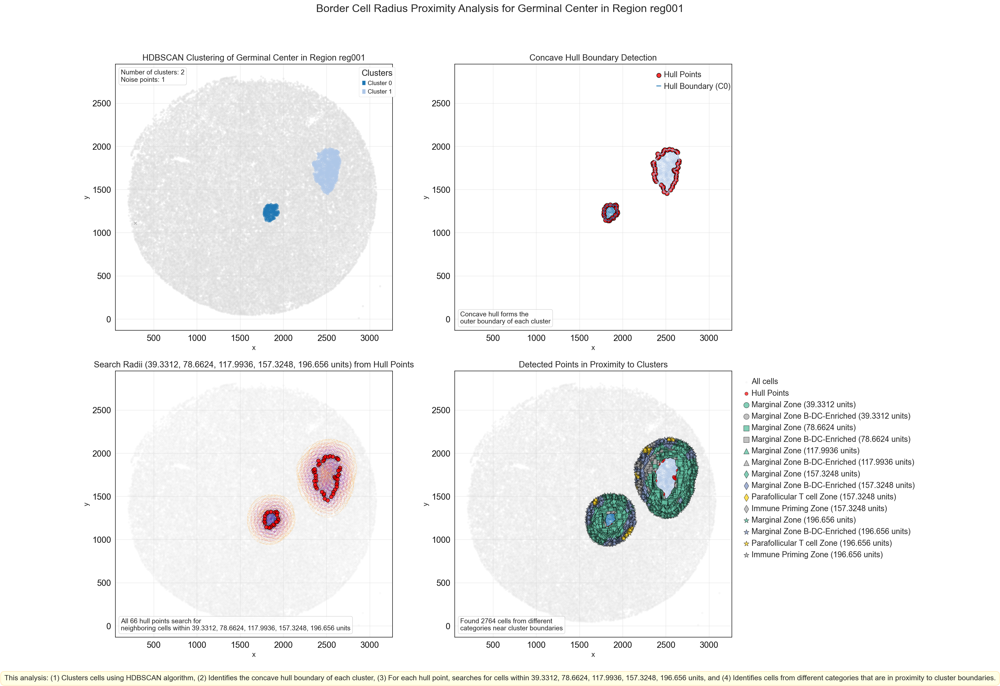

Finished reg001_Germinal Center


In [ ]:
# this region result is also saved to adata.uns
results, outlines_results = sp.tl.patch_proximity_analysis(
    adata, # the annotated adata object
    region_column = "unique_region", # column with the region information
    patch_column = "CN_k20_n6_annot", # column with the patch information (derive patches from this column)
    group="Germinal Center", # group to consider
    min_cluster_size=50, # minimum cluster size to consider
    x_column='x', y_column='y', # spatial coordinates
    radius = [20, 40, 60, 80, 100], # to get the distance in µm
    edge_neighbours = 1, # number of neighbours to consider for edge detection if set to 1 only the hull is considered
    plot = True, # plot the results for demonstration and/or documentation (set to False to skip plotting - improves speed)
    original_unit_scale = 1.96656, # scale factor for the units (1 = 1px per unit e.g. µm)
    method= "border_cell_radius", # method to use for the edge detection
    key_name = "ppa_result_20_40_60_80_100_border_cell_radius", # key name to store the result in adata.uns
    save_geojson = False, # save the results as geojson
    ) # plot detection for demonstration purposes

On the other hand, we provide the hull_expansion method. It runs faster and works well when patches are evenly filled with cells. This method takes the detected hull and expands the polygon outward by a specified radius. For more fragmented patches, we recommend using the border_cell_radius method described above.

Processing reg002_Germinal Center
Estimated number of clusters: 4
Estimated number of noise points: 7


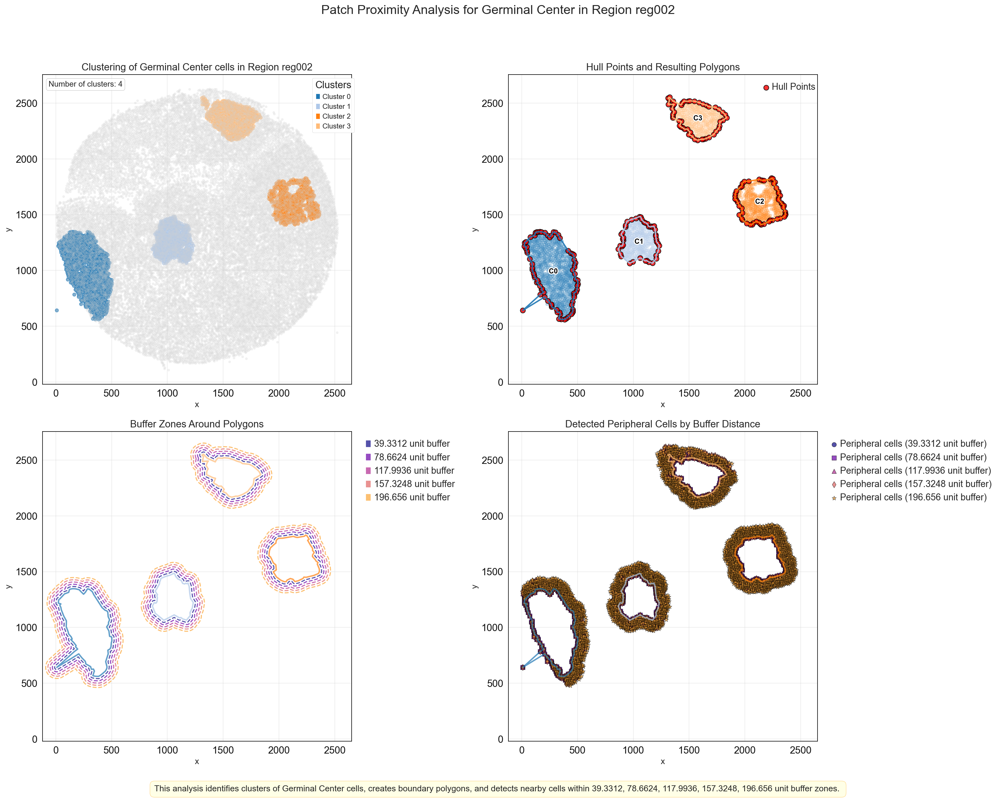

Processing reg001_Germinal Center
Estimated number of clusters: 2
Estimated number of noise points: 1


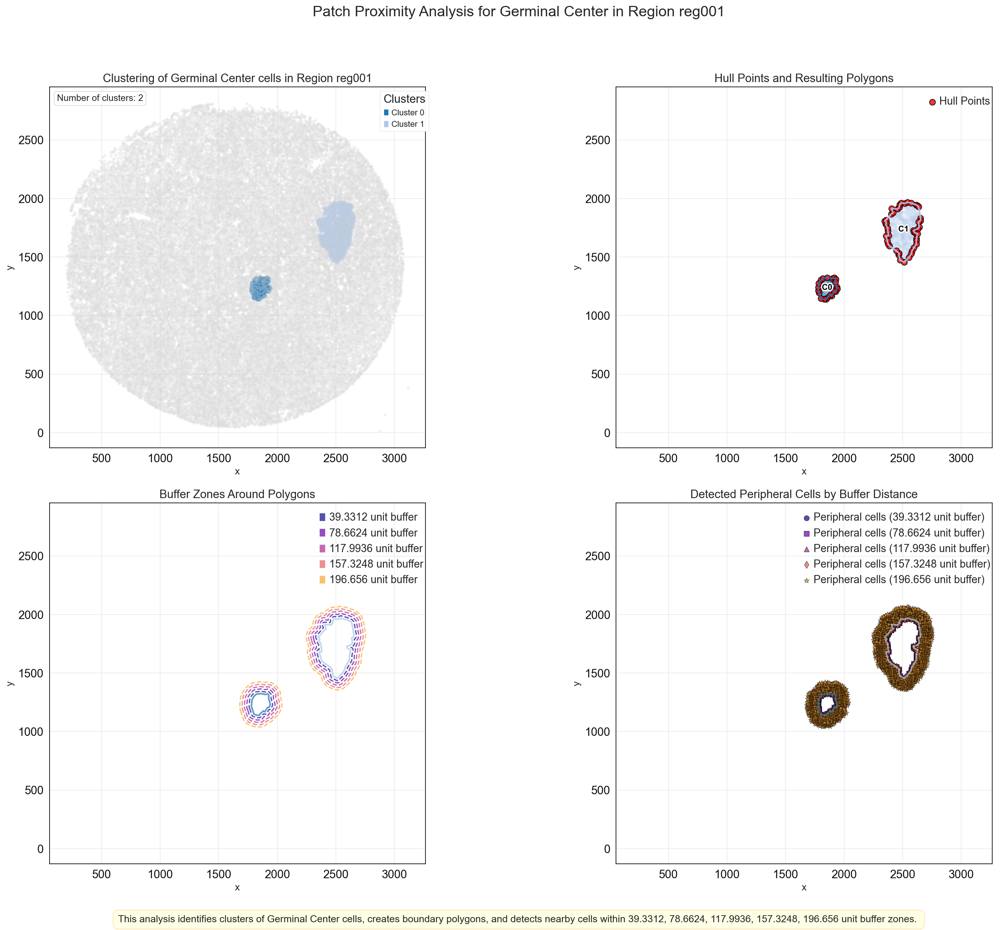

In [ ]:
# this region result is also saved to adata.uns
results, outlines_results = sp.tl.patch_proximity_analysis(
    adata, # the annotated adata object
    region_column = "unique_region", # column with the region information
    patch_column = "CN_k20_n6_annot", # column with the patch information (derive patches from this column)
    group="Germinal Center", # group to consider
    min_cluster_size=50, # minimum cluster size to consider
    x_column='x', y_column='y', # spatial coordinates
    radius = [20,40, 60, 80, 100], # to get the distance in µm
    edge_neighbours = 1, # number of neighbours to consider for edge detection if set to 1 only the hull is considered
    plot = True, # plot the results for demonstration and/or documentation (set to False to skip plotting - improves speed)
    original_unit_scale = 1.96656, # scale factor for the units (1 = 1px per unit e.g. µm)
    method= "hull_expansion", # method to use for the edge detection
    key_name = "ppa_result_20_40_60_80_100_border_cell_radius", # key name to store the result in adata.uns
    save_geojson = False, # save the results as geojson
    ) # plot detection for demonstration purposes

The exported results dataframe stores the cells that were detected in spatial proximity to the patch. Every patch has a unique_patch_ID. The distance_from_patch column shows in which radius the cell was detected.

In [5]:
results

,DAPI,x,y,area,region_num,unique_region,condition,leiden_1,leiden_1_subcluster,cell_type_coarse,...,cell_type_coarse_f_subcluster,cell_type_coarse_f_f,cell_type,CN_k20_n6,CN_k20_n6_annot,geometry,cluster,patch_id,distance_from_patch,unique_patch_ID
0,81.202429,358.319838,546.550607,247.0,1,reg002,tonsillitis,24,24,Mast cell,...,Mast cell,Mast cell,Mast cell,0,Immune Priming Zone,POINT (358.32 546.551),0,0,39.3312,reg002_Immune Priming Zone_patch_no_0
1,145.960396,390.752475,549.608911,202.0,1,reg002,tonsillitis,13,13,M2 Macrophage,...,M2 Macrophage,M2 Macrophage,M2 Macrophage,0,Immune Priming Zone,POINT (390.752 549.609),0,0,39.3312,reg002_Immune Priming Zone_patch_no_0
2,109.078341,345.820276,554.129032,217.0,1,reg002,tonsillitis,24,24,Mast cell,...,Mast cell,Mast cell,Mast cell,0,Immune Priming Zone,POINT (345.82 554.129),0,0,39.3312,reg002_Immune Priming Zone_patch_no_0
3,81.521739,368.887681,558.423913,276.0,1,reg002,tonsillitis,24,24,Mast cell,...,Mast cell,Mast cell,Mast cell,0,Immune Priming Zone,POINT (368.888 558.424),0,0,39.3312,reg002_Immune Priming Zone_patch_no_0
4,63.307339,382.293578,560.876147,218.0,1,reg002,tonsillitis,6,"6,1",GCB,...,GCB,GCB,GCB,4,Germinal Center,POINT (382.294 560.876),0,0,39.3312,reg002_Germinal Center_patch_no_0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3356,146.363333,2643.576667,2037.953333,300.0,0,reg001,tonsil,1,1,B cell,...,B cell,B cell,B cell,1,Marginal Zone,POINT (2643.577 2037.953),1,1,196.6560,reg001_Marginal Zone_patch_no_1
3357,160.639269,2593.159817,2039.452055,219.0,0,reg001,tonsil,1,1,B cell,...,B cell,B cell,B cell,1,Marginal Zone,POINT (2593.16 2039.452),1,1,196.6560,reg001_Marginal Zone_patch_no_1
3358,103.058511,2615.765957,2041.595745,188.0,0,reg001,tonsil,1,1,B cell,...,B cell,B cell,B cell,1,Marginal Zone,POINT (2615.766 2041.596),1,1,196.6560,reg001_Marginal Zone_patch_no_1
3359,194.094340,2628.419811,2043.721698,212.0,0,reg001,tonsil,1,1,B cell,...,B cell,B cell,B cell,1,Marginal Zone,POINT (2628.42 2043.722),1,1,196.6560,reg001_Marginal Zone_patch_no_1


Outlines_results holds the coordinates of the outlining cells. Additionally, users can save the outline of the hull as a polygon in the GeoJSON format. This allows to later load the patch coordinates into an interactive viewer such as TissUUmaps.

In [6]:
outlines_results

,DAPI,x,y,area,region_num,unique_region,condition,leiden_1,leiden_1_subcluster,cell_type_coarse,cell_type_coarse_subcluster,cell_type_coarse_f,cell_type_coarse_f_subcluster,cell_type_coarse_f_f,cell_type,CN_k20_n6,CN_k20_n6_annot,cluster,patch_id
0,64.813397,344.782297,608.691388,418.0,1,reg002,tonsillitis,6,"6,0",GCB,GCB,GCB,GCB,GCB,GCB,4,Germinal Center,0,0
1,48.560870,337.221739,626.443478,230.0,1,reg002,tonsillitis,6,"6,0",GCB,GCB,GCB,GCB,GCB,GCB,4,Germinal Center,0,0
2,110.027778,318.496914,624.533951,324.0,1,reg002,tonsillitis,7,7,CD8+ T cell,CD8+ T cell,CD8+ T cell,CD8+ T cell,CD8+ T cell,CD8+ T cell,4,Germinal Center,0,0
3,135.231293,311.404762,648.299320,294.0,1,reg002,tonsillitis,6,"6,0",GCB,GCB,GCB,GCB,GCB,GCB,4,Germinal Center,0,0
4,118.687500,268.031250,673.007812,128.0,1,reg002,tonsillitis,1,1,B cell,B cell,B cell,B cell,B cell,B cell,4,Germinal Center,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,79.189781,2445.937956,1552.602190,274.0,0,reg001,tonsil,6,"6,3",GCB,GCB,GCB,GCB,GCB,GCB,4,Germinal Center,1,1
62,90.525926,2385.733333,1596.533333,270.0,0,reg001,tonsil,6,"6,3",GCB,GCB,GCB,GCB,GCB,GCB,4,Germinal Center,1,1
63,52.434959,2374.447154,1615.219512,246.0,0,reg001,tonsil,6,"6,3",GCB,GCB,GCB,GCB,GCB,GCB,4,Germinal Center,1,1
64,63.832215,2368.205817,1640.062640,447.0,0,reg001,tonsil,6,"6,3",GCB,GCB,GCB,GCB,GCB,GCB,4,Germinal Center,1,1


Often it is more informative to derive the cellular content within a range of distances.

In [ ]:
# save adata
adata.write(output_dir + 'adata_nn_demo_annotated_cn.h5ad')

... storing 'region_num' as categorical
... storing 'unique_region' as categorical
... storing 'condition' as categorical
... storing 'leiden_1' as categorical
... storing 'leiden_1_subcluster' as categorical
... storing 'cell_type_coarse' as categorical
... storing 'cell_type_coarse_subcluster' as categorical
... storing 'cell_type_coarse_f' as categorical
... storing 'cell_type_coarse_f_subcluster' as categorical
... storing 'cell_type_coarse_f_f' as categorical
... storing 'cell_type' as categorical
... storing 'CN_k20_n6_annot' as categorical


SPACEc can visualize the PPA results as donut plot showing the percentages of cell types or CNs within a given radius around the patches. Percentages are averaged over all regions in the selected condition. The donut plot can show up to five distances.

### Visualization

The donut plots can be plotted with two options: within or between
- "within": Includes all cells up to the specified distance. Rings represent cumulative proportions.
- "between": Includes only cells between the current distance ring's outer radius and the previous ring's outer radius. Rings represent proportions in discrete intervals.

Creating visualization for condition = tonsillitis
Radius 20: 303 cells
Radius 40: 933 cells
Radius 60: 1602 cells
Radius 80: 2290 cells
Radius 100: 2938 cells


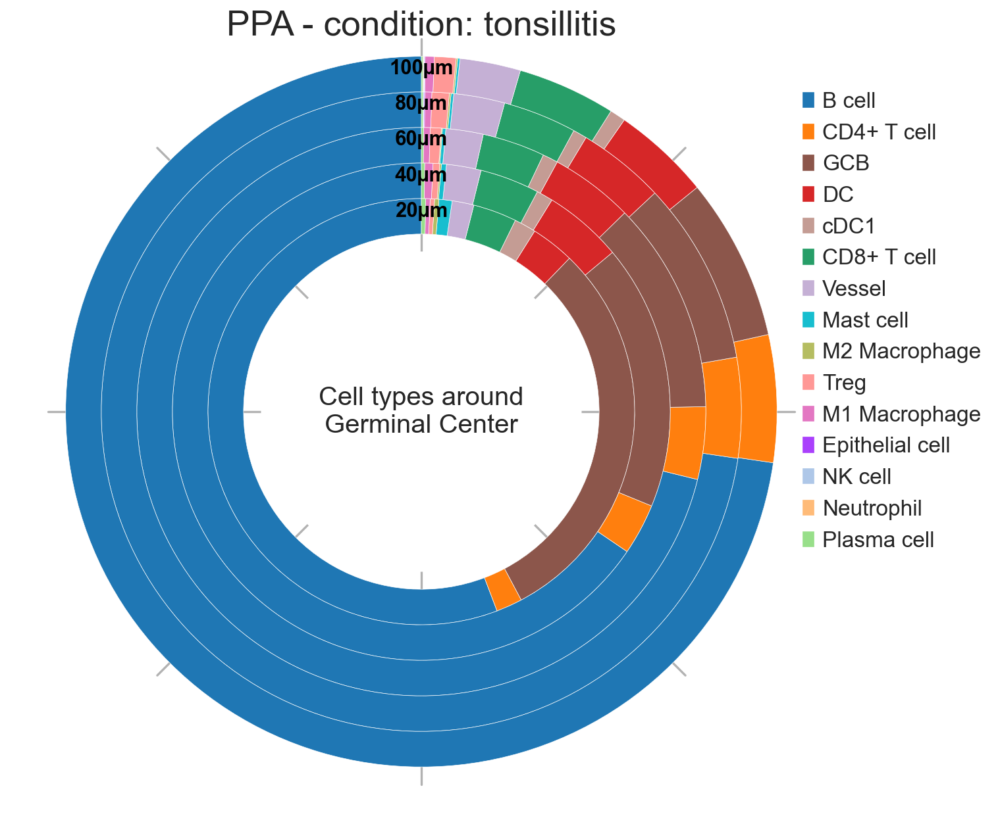

Creating visualization for condition = tonsil
Radius 20: 82 cells
Radius 40: 294 cells
Radius 60: 558 cells
Radius 80: 843 cells
Radius 100: 1136 cells


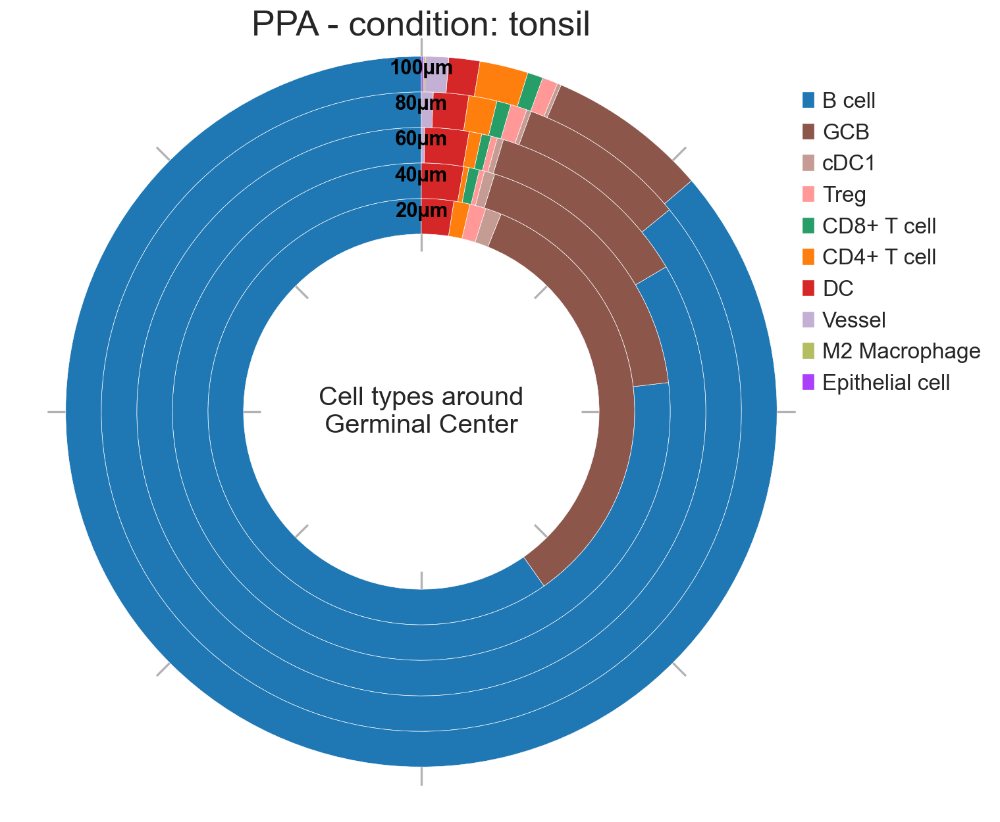

{'tonsillitis': <Figure size 800x800 with 1 Axes>,
 'tonsil': <Figure size 800x800 with 1 Axes>}

In [ ]:
# Donut plots for cell types around Germinal Center
sp.pl.ppa_res_donut(
    adata,
    cat_col = 'cell_type',
    key_name="ppa_result_20_40_60_80_100_border_cell_radius",
    palette=None,
    distance_mode="within",  # "within" or "between"
    unit="µm",
    figsize=(10, 10),
    add_guides=True,
    text="Cell types around Germinal Center",
    label_color="black",
    group_by= 'condition',
    title="PPA",
) 

Creating visualization for condition = tonsillitis
Radius 20: 303 cells
Radius 40: 630 cells
Radius 60: 669 cells
Radius 80: 688 cells
Radius 100: 648 cells


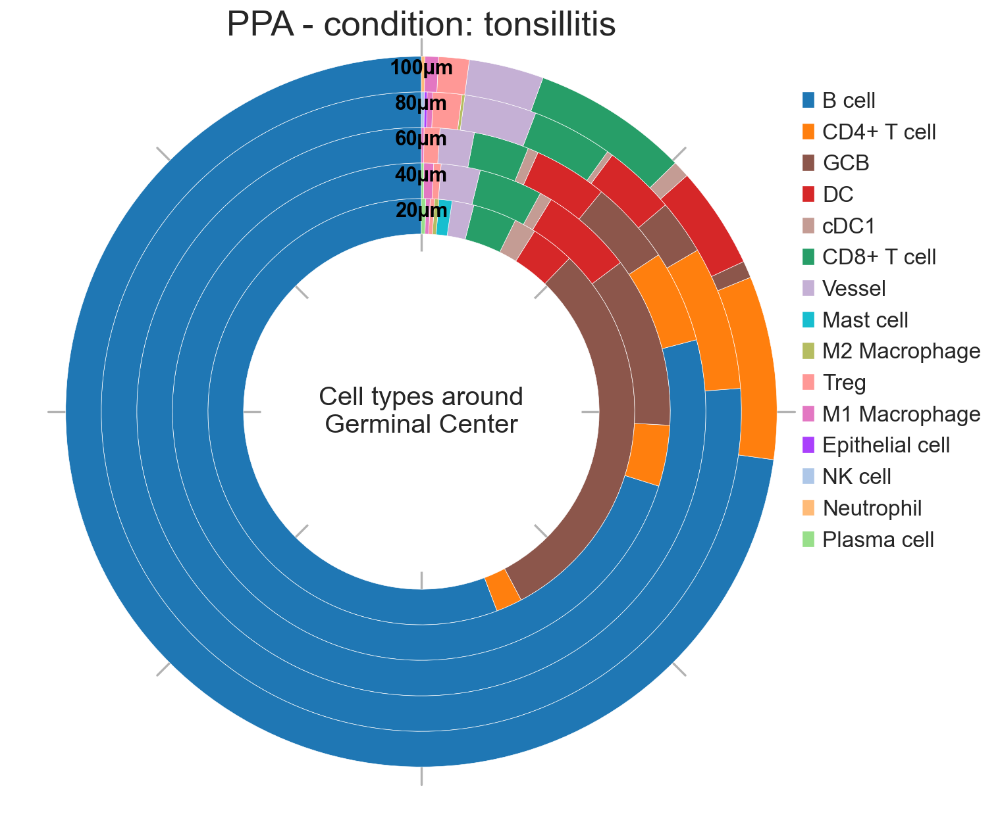

Creating visualization for condition = tonsil
Radius 20: 82 cells
Radius 40: 212 cells
Radius 60: 264 cells
Radius 80: 285 cells
Radius 100: 293 cells


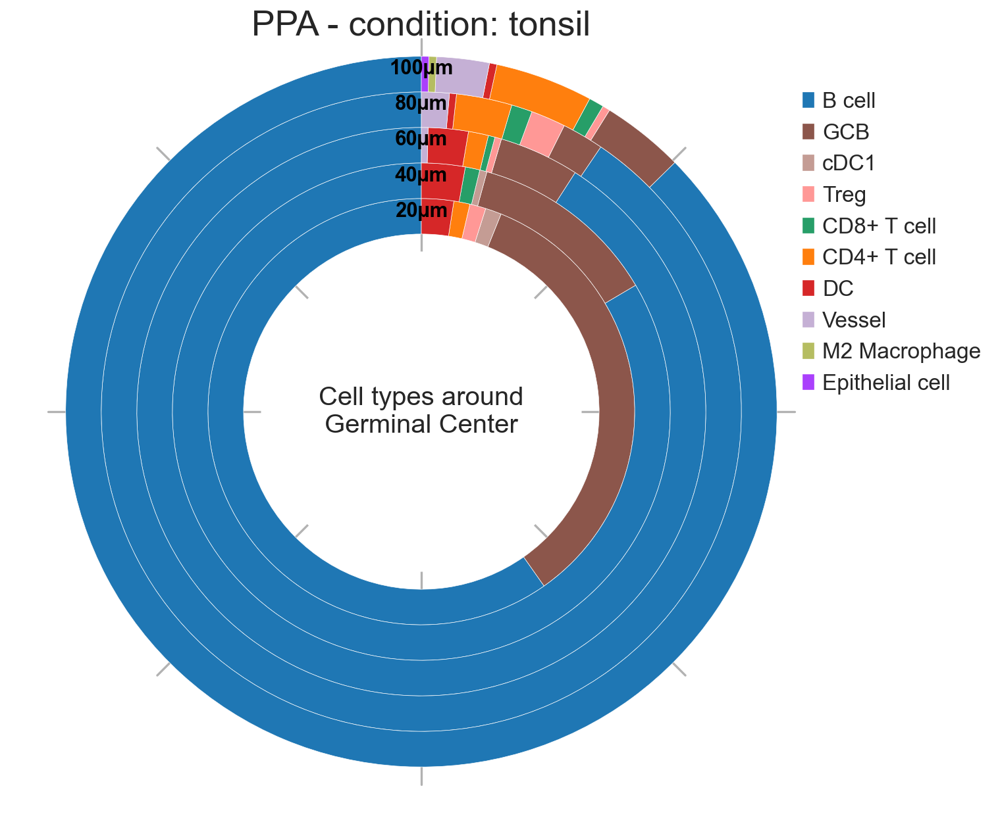

{'tonsillitis': <Figure size 800x800 with 1 Axes>,
 'tonsil': <Figure size 800x800 with 1 Axes>}

In [ ]:
# Donut plots for cell types around Germinal Center
sp.pl.ppa_res_donut(
    adata,
    cat_col = 'cell_type',
    key_name="ppa_result_20_40_60_80_100_border_cell_radius",
    palette=None,
    distance_mode="between",  # "within" or "between"
    unit="µm",
    figsize=(10, 10),
    add_guides=True,
    text="Cell types around Germinal Center",
    label_color="black",
    group_by= 'condition',
    title="PPA",
) 

Creating visualization for condition = tonsillitis
Radius 20: 303 cells
Radius 40: 933 cells
Radius 60: 1602 cells
Radius 80: 2290 cells
Radius 100: 2938 cells


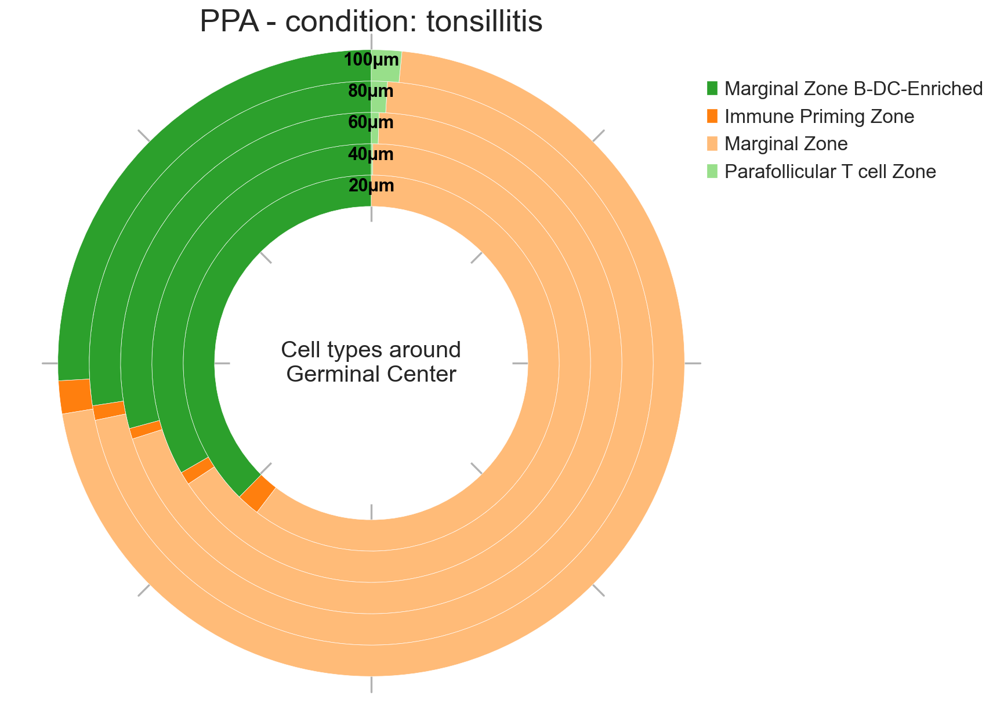

Creating visualization for condition = tonsil
Radius 20: 82 cells
Radius 40: 294 cells
Radius 60: 558 cells
Radius 80: 843 cells
Radius 100: 1136 cells


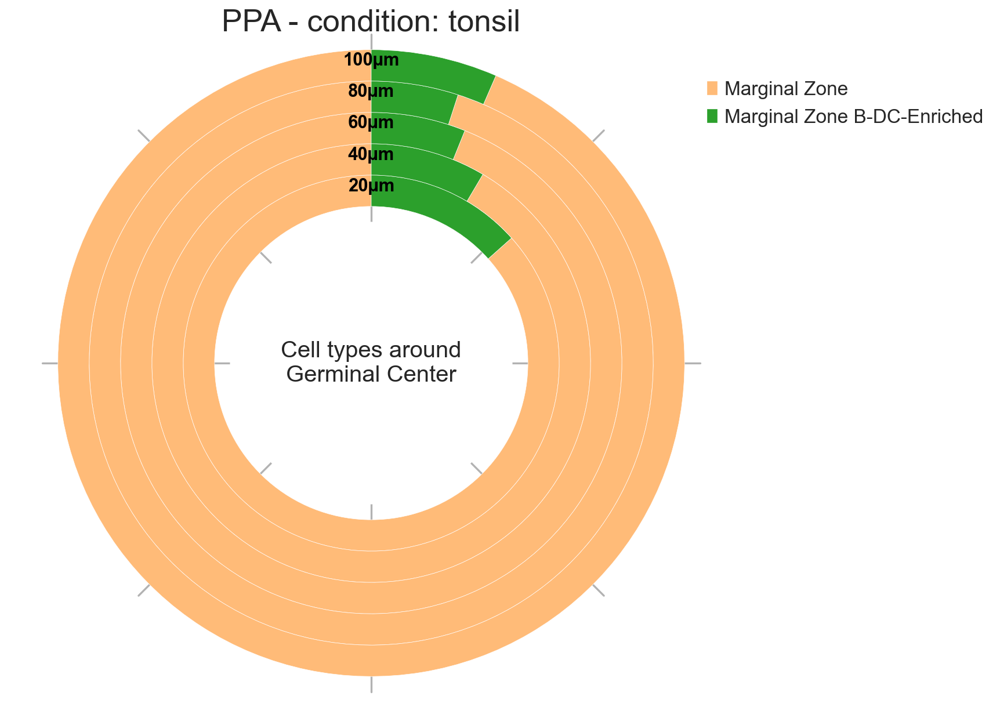

{'tonsillitis': <Figure size 800x800 with 1 Axes>,
 'tonsil': <Figure size 800x800 with 1 Axes>}

In [ ]:
# Donut plots for cell types around Germinal Center
sp.pl.ppa_res_donut(
    adata,
    cat_col = 'CN_k20_n6_annot',
    key_name="ppa_result_20_40_60_80_100_border_cell_radius",
    palette=None,
    distance_mode="within",  # "within" or "between"
    unit="µm",
    figsize=(10, 10),
    add_guides=True,
    text="Cell types around Germinal Center",
    label_color="black",
    group_by= 'condition',
    title="PPA",
) 

Creating visualization for condition = tonsillitis
Radius 20: 303 cells
Radius 40: 630 cells
Radius 60: 669 cells
Radius 80: 688 cells
Radius 100: 648 cells


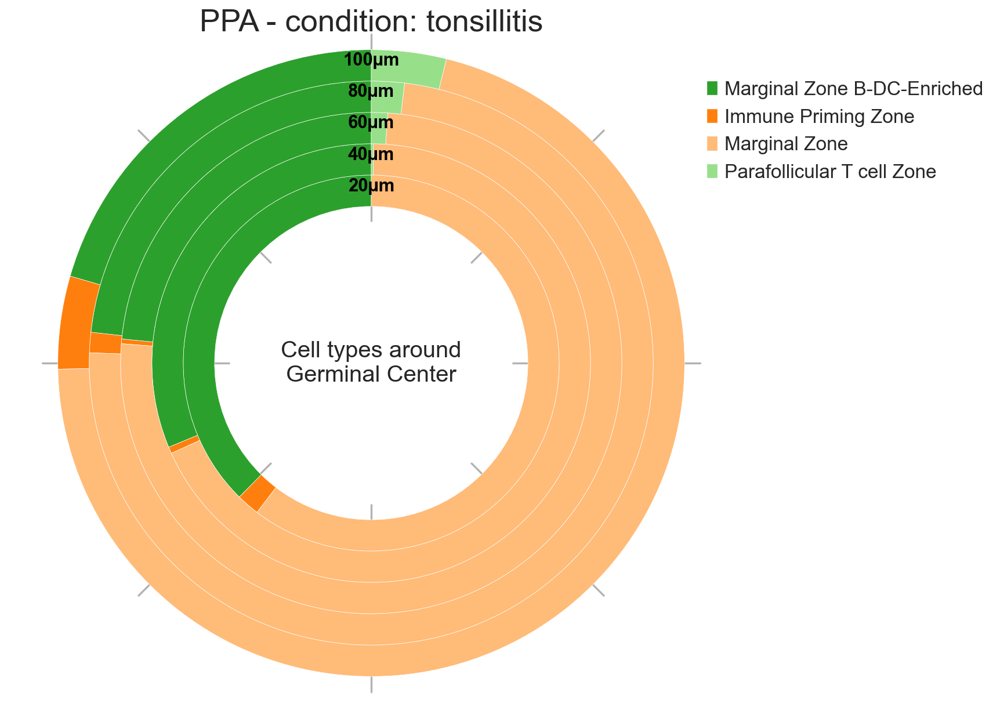

Creating visualization for condition = tonsil
Radius 20: 82 cells
Radius 40: 212 cells
Radius 60: 264 cells
Radius 80: 285 cells
Radius 100: 293 cells


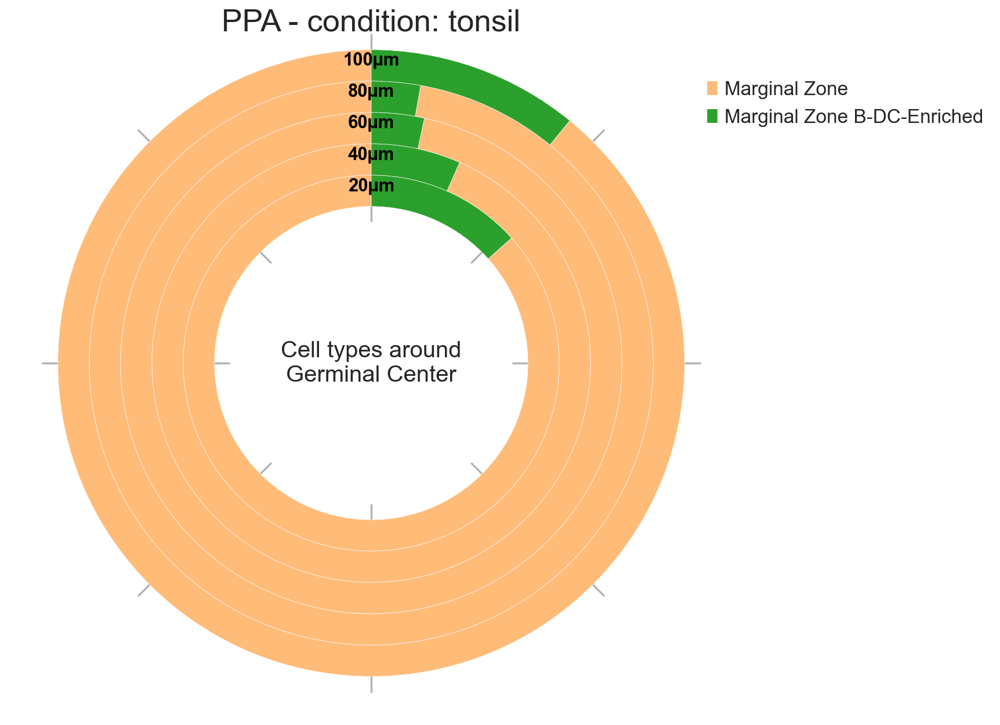

{'tonsillitis': <Figure size 800x800 with 1 Axes>,
 'tonsil': <Figure size 800x800 with 1 Axes>}

In [ ]:
# Donut plots for cell types around Germinal Center
sp.pl.ppa_res_donut(
    adata,
    cat_col = 'CN_k20_n6_annot',
    key_name="ppa_result_20_40_60_80_100_border_cell_radius",
    palette=None,
    distance_mode="between",  # "within" or "between"
    unit="µm",
    figsize=(10, 10),
    add_guides=True,
    text="Cell types around Germinal Center",
    label_color="black",
    group_by= 'condition',
    title="PPA",
) 